In [2]:
# Basic Data Handling
import pandas as pd
import numpy as np
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud

# Preprocessing & NLP
import re
import string
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer

# Model
from sklearn.linear_model import PassiveAggressiveClassifier
from sklearn.pipeline import Pipeline
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

# Optional: For saving the model later
import joblib


In [4]:
# Load datasets
df1 = pd.read_csv(r"C:\Users\sudeepta\Desktop\PAC\dataset2.csv")  # Your Kaggle dataset
df2 = pd.read_csv(r"C:\Users\sudeepta\Desktop\PAC\dataset6.csv")  # From 2019 elections
df3 = pd.read_csv(r"C:\Users\sudeepta\Desktop\PAC\dataset6.1.csv")

# Quick glance
print(df1.head())
print(df2.head())
print(df3.head())


                               Tweet ID           Username  \
0  05a72860-7fbf-4565-a43c-961b732f0240  samanthagillespie   
1  0c3735c8-3d67-4c50-b639-14010e918d31            rfisher   
2  044365c9-0e4a-46ce-9a00-1e5d184ec5b7            bgarcia   
3  f37cc2c8-4ebf-483b-a970-ef9c2e0f4d37           robert13   
4  c78dd47e-df0d-47ff-9c29-de9287a96429         erinwalker   

                                          Tweet Text  Retweets  Favorites  \
0  Talk get bag focus pattern necessary. Step com...        81         14   
1  Front measure modern design. Policy go start f...        35         31   
2  Lead which daughter join. Yeah world sort pers...        94         13   
3  Morning first receive. Special land oil.\nWond...        75         54   
4  Artist church ago. Gun hold bank plan natural ...        11         27   

   Followers                   Timestamp Sentiment  
0        409  2022-11-07 18:49:55.793691   Neutral  
1       3657  2023-01-21 21:51:43.768392  Positive  
2    

In [5]:
# Rename columns
df1 = df1.rename(columns={'tweet': 'text', 'label': 'sentiment'})  # assuming column names
df2 = df2.rename(columns={df2.columns[0]: 'text', df2.columns[1]: 'sentiment'})
df3 = df3.rename(columns={df3.columns[0]: 'text', df3.columns[1]: 'sentiment'})

# Map numeric sentiment to text for consistency
sentiment_map = {1: 'positive', 0: 'neutral', -1: 'negative'}
df2['sentiment'] = df2['sentiment'].map(sentiment_map)
df3['sentiment'] = df3['sentiment'].map(sentiment_map)

# Combine all into one
df = pd.concat([df1, df2, df3], ignore_index=True)

# Drop nulls & duplicates
df.dropna(subset=['text', 'sentiment'], inplace=True)
df.drop_duplicates(subset='text', inplace=True)


In [6]:
#Text Preprocessing
nltk.download('stopwords')
nltk.download('wordnet')

stop_words = set(stopwords.words('english'))
lemmatizer = WordNetLemmatizer()

def clean_text(text):
    text = text.lower()
    text = re.sub(r"http\S+|www\S+|https\S+", '', text, flags=re.MULTILINE)  # remove URLs
    text = re.sub(r'\@w+|\#','', text)  # remove mentions and hashtags
    text = re.sub(r'[^A-Za-z\s]', '', text)  # remove punctuation/numbers
    tokens = text.split()
    tokens = [lemmatizer.lemmatize(word) for word in tokens if word not in stop_words]
    return " ".join(tokens)

df['clean_text'] = df['text'].apply(clean_text)


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\sudeepta\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\sudeepta\AppData\Roaming\nltk_data...


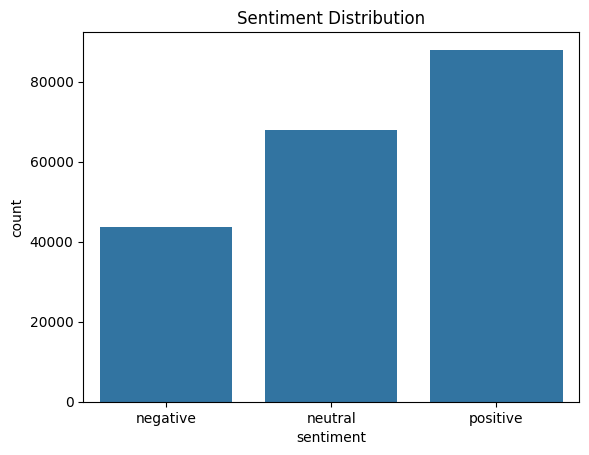

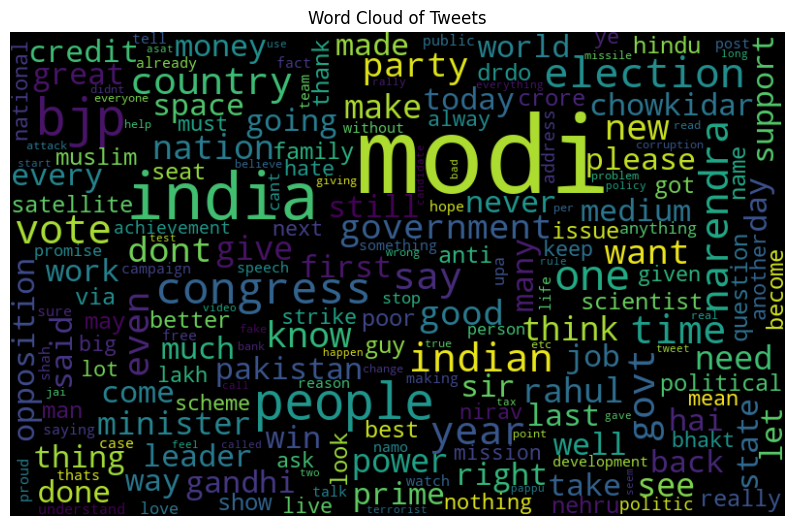

In [7]:
#EDA

# Sentiment distribution
sns.countplot(x='sentiment', data=df)
plt.title("Sentiment Distribution")
plt.show()

# WordCloud
all_words = ' '.join(df['clean_text'])
wordcloud = WordCloud(width=800, height=500, max_font_size=110, collocations=False).generate(all_words)
plt.figure(figsize=(10, 7))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.title("Word Cloud of Tweets")
plt.show()


In [8]:
#BUILD & TRAIN PAC MODEL

X = df['clean_text']
y = df['sentiment']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

pipeline = Pipeline([
    ('tfidf', TfidfVectorizer(ngram_range=(1,2), max_df=0.95, min_df=5)),
    ('pac', PassiveAggressiveClassifier(max_iter=1000, random_state=42))
])

pipeline.fit(X_train, y_train)
y_pred = pipeline.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.8416704221120624
Classification Report:
               precision    recall  f1-score   support

    negative       0.77      0.76      0.77      8751
     neutral       0.85      0.87      0.86     13592
    positive       0.87      0.86      0.86     17599

    accuracy                           0.84     39942
   macro avg       0.83      0.83      0.83     39942
weighted avg       0.84      0.84      0.84     39942



In [9]:
joblib.dump(pipeline, 'pac_sentiment_model.pkl')


['pac_sentiment_model.pkl']

In [10]:
#Hyperparameter Tuning for Passive-Aggressive Classifier
from sklearn.model_selection import GridSearchCV

param_grid = {
    'pac__C': [0.01, 0.1, 1, 10],
    'pac__max_iter': [100, 500, 1000],
    'tfidf__max_df': [0.8, 0.9, 1.0],
    'tfidf__ngram_range': [(1,1), (1,2)]
}

pipeline = Pipeline([
    ('tfidf', TfidfVectorizer()),
    ('pac', PassiveAggressiveClassifier(random_state=42))
])

grid = GridSearchCV(pipeline, param_grid, cv=3, n_jobs=-1, verbose=2)
grid.fit(X_train, y_train)

print("Best Score:", grid.best_score_)
print("Best Params:", grid.best_params_)

# Evaluate on test set
y_pred_tuned = grid.predict(X_test)
print("Tuned Accuracy:", accuracy_score(y_test, y_pred_tuned))
print("Tuned Classification Report:\n", classification_report(y_test, y_pred_tuned))


Fitting 3 folds for each of 72 candidates, totalling 216 fits
Best Score: 0.8947898716118372
Best Params: {'pac__C': 0.1, 'pac__max_iter': 100, 'tfidf__max_df': 0.8, 'tfidf__ngram_range': (1, 1)}
Tuned Accuracy: 0.9046867958539883
Tuned Classification Report:
               precision    recall  f1-score   support

    negative       0.86      0.83      0.85      8751
     neutral       0.90      0.95      0.93     13592
    positive       0.93      0.90      0.92     17599

    accuracy                           0.90     39942
   macro avg       0.90      0.90      0.90     39942
weighted avg       0.90      0.90      0.90     39942



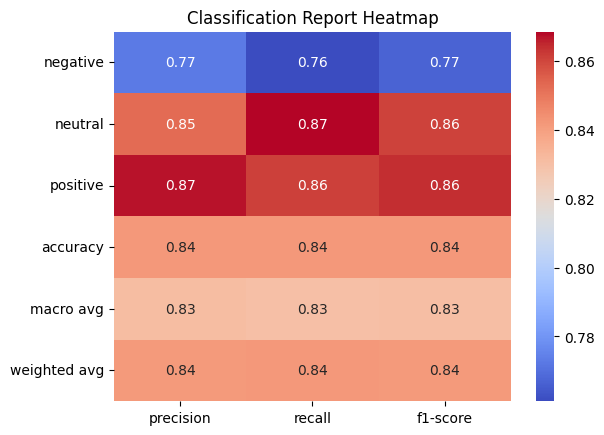

In [11]:
#Heatmap
from sklearn.metrics import classification_report
import seaborn as sns
import pandas as pd

report = classification_report(y_test, y_pred, output_dict=True)
sns.heatmap(pd.DataFrame(report).iloc[:-1, :].T, annot=True, cmap='coolwarm')
plt.title("Classification Report Heatmap")
plt.show()


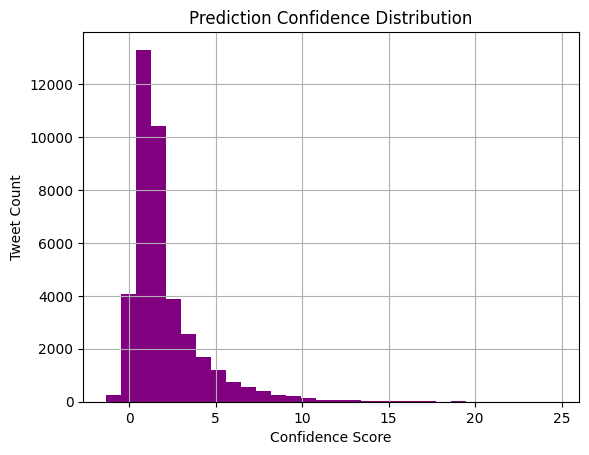

In [12]:
#Prediction Confidence Histogram
if hasattr(grid.best_estimator_.named_steps['pac'], "decision_function"):
    confidences = grid.best_estimator_.named_steps['pac'].decision_function(
        grid.best_estimator_.named_steps['tfidf'].transform(X_test))
    confidence_scores = confidences.max(axis=1)
    plt.hist(confidence_scores, bins=30, color='purple')
    plt.title("Prediction Confidence Distribution")
    plt.xlabel("Confidence Score")
    plt.ylabel("Tweet Count")
    plt.grid(True)
    plt.show()


In [13]:
#ROC
from sklearn.preprocessing import LabelBinarizer
from sklearn.metrics import roc_curve, auc
from sklearn.multiclass import OneVsRestClassifier
import matplotlib.pyplot as plt
from itertools import cycle

# Binarize the labels
lb = LabelBinarizer()
y_test_bin = lb.fit_transform(y_test)
y_pred_proba = pipeline.named_steps['pac'].decision_function(
    pipeline.named_steps['tfidf'].transform(X_test)
)

# Set up ROC Curve details
fpr = dict()
tpr = dict()
roc_auc = dict()
n_classes = y_test_bin.shape[1]

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plotting
colors = cycle(['blue', 'green', 'red'])
plt.figure(figsize=(10, 7))

for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC curve (class = {lb.classes_[i]}) - AUC = {roc_auc[i]:0.2f}')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate', fontsize=12)
plt.ylabel('True Positive Rate', fontsize=12)
plt.title('Multiclass ROC Curve (One-vs-Rest)', fontsize=14)
plt.legend(loc='lower right')
plt.grid(alpha=0.3)
plt.show()


NotFittedError: The TF-IDF vectorizer is not fitted

In [14]:
#mini dashboard
import plotly.express as px
import plotly.graph_objects as go

# 1. Sentiment Distribution
fig_sentiment = px.histogram(df, x='sentiment', title='Sentiment Distribution', color='sentiment')
fig_sentiment.show()

# 2. Tweet Length Distribution
df['text_length'] = df['text'].apply(len)
fig_length = px.histogram(df, x='text_length', color='sentiment',
                          nbins=50, title='Tweet Length Distribution by Sentiment')
fig_length.show()

# 3. Word Frequency (Top 20 words by sentiment)
from sklearn.feature_extraction.text import CountVectorizer

def get_top_n_words(corpus, n=None):
    vec = CountVectorizer(stop_words='english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0)
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    return sorted(words_freq, key=lambda x: x[1], reverse=True)[:n]

for sentiment in ['positive', 'neutral', 'negative']:
    top_words = get_top_n_words(df[df['sentiment'] == sentiment]['clean_text'], 20)
    words, counts = zip(*top_words)
    fig = px.bar(x=words, y=counts, title=f"Top 20 Words in {sentiment.capitalize()} Tweets")
    fig.show()

# 4. Time Trend (if timestamp available)
if 'timestamp' in df.columns:
    df['timestamp'] = pd.to_datetime(df['timestamp'])
    df['date'] = df['timestamp'].dt.date
    trend_df = df.groupby(['date', 'sentiment']).size().reset_index(name='count')

    fig_trend = px.line(trend_df, x='date', y='count', color='sentiment',
                        title="Tweet Volume Over Time by Sentiment")
    fig_trend.show()


c:\Users\sudeepta\anaconda3\envs\tempGPU\lib\site-packages\plotly\express\_core.py:1979: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  sf: grouped.get_group(s if len(s) > 1 else s[0])


c:\Users\sudeepta\anaconda3\envs\tempGPU\lib\site-packages\plotly\express\_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



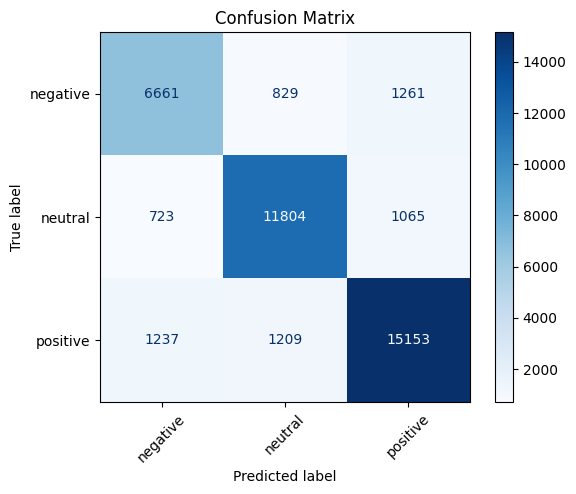

In [15]:
#Confusion Matrix
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm = confusion_matrix(y_test, y_pred, labels=grid.best_estimator_.named_steps['pac'].classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=grid.best_estimator_.named_steps['pac'].classes_)
disp.plot(cmap='Blues', xticks_rotation=45)
plt.title("Confusion Matrix")
plt.grid(False)
plt.show()


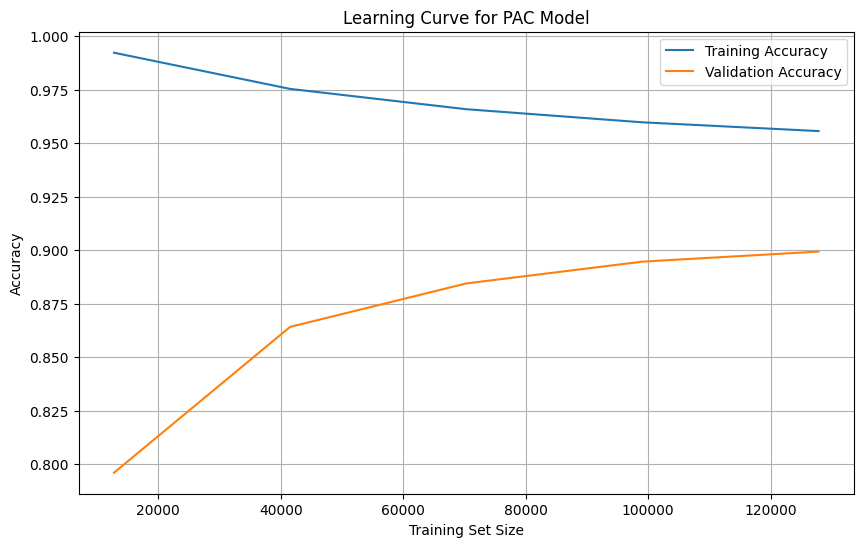

In [16]:
#Learning Curve
from sklearn.model_selection import learning_curve

train_sizes, train_scores, test_scores = learning_curve(
    grid.best_estimator_, X_train, y_train, cv=5, scoring='accuracy', n_jobs=-1)

train_mean = train_scores.mean(axis=1)
test_mean = test_scores.mean(axis=1)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_mean, label='Training Accuracy')
plt.plot(train_sizes, test_mean, label='Validation Accuracy')
plt.title("Learning Curve for PAC Model")
plt.xlabel("Training Set Size")
plt.ylabel("Accuracy")
plt.legend()
plt.grid(True)
plt.show()
